# Анализ рынка заведений общественного питания Москвы

Настоящее исследование представляет собой анализ закономерностей и особенностей рынка общественного питания в Москве. Необходимо выяснить перспективность и востребованность в Москве новых заведений общественного питания в разрезе различных типов заведений, их ценовых сегментов и мест расположения.

Главная задача, поставленная перед аналитиком - дать возможность принять решение об открытии новой кофейни, руководствуясь актуальными, объективными и точными данными о рынке общепита в Москве.

Для анализа были взяты данные сервисов Яндекс.Карты и Яндекс.Бизнес по состоянию на лето 2022 года. Эти данные сведены в одну базу данных, где для каждого заведения указаны:
- местоположение и время работы
- категория заведения (ресторан, пиццерия, столовая и т.п.)
- средний чек
- количество посадочных мест
- пользовательский рейтинг

В ходе работы предстоит исследовать следующие вопросы:
- распределение заведений по категориям
- соотношение сетевых и несетевых заведений в Москве, самые популярные сети
- территориальное распределение заведений (в разрезе категорий, рейтингов)
- зависимость рейтинга заведения от его категории
- зависимость среднего чека от категории заведения и его местоположения

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from folium import Map, Choropleth, Marker, GeoJson
from folium.plugins import MarkerCluster

In [2]:
data_raw = pd.read_csv('/datasets/moscow_places.csv')

In [3]:
data_raw.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Датасет содержит 8 406 записей о заведениях общественного питания. Данные о каждом заведении представлены в 14 столбцах, в т.ч. название, категория заведения, адрес, в т.ч. административный район, время работы, средний чек и т.д.

In [4]:
data_raw.describe()

,lat,lng,rating,middle_avg_bill,middle_coffee_cup,chain,seats
count,8406.000000,8406.000000,8406.000000,3149.000000,535.000000,8406.000000,4795.000000
mean,55.750109,37.608570,4.229895,958.053668,174.721495,0.381275,108.421689
std,0.069658,0.098597,0.470348,1009.732845,88.951103,0.485729,122.833396
min,55.573942,37.355651,1.000000,0.000000,60.000000,0.000000,0.000000
25%,55.705155,37.538583,4.100000,375.000000,124.500000,0.000000,40.000000
50%,55.753425,37.605246,4.300000,750.000000,169.000000,0.000000,75.000000
75%,55.795041,37.664792,4.400000,1250.000000,225.000000,1.000000,140.000000
max,55.928943,37.874466,5.000000,35000.000000,1568.000000,1.000000,1288.000000


Значения в столбцах middle_avg_bill и seats (количество посадочных мест) вероятно содержат аномальные, ошибочные данные. Непонятно, как следует интерпретировать величину среднего чека, равную 0, или количество посадочных мест в заведении, равное 1 288.

In [5]:
data_raw.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


В ряде колонок видим много NaN, датасет нуждается в предобработке данных.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b>  А посомтреть на датафрейм? 

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> УРа) 

## Подготовка данных

In [6]:
# создадим копию исходного датасета для работы
data = data_raw.copy()
data.duplicated().sum()

0

Дублированных записей нет.

Проверим, нет ли записей, относящихся к одному и тому же заведению, т.е. таких, у которых совпадают значения в колонках name и address.

In [7]:
def convert_to_lower(row):
    row['name_lowercase'] = row['name'].lower()
    row['address_lowercase'] = row['address'].lower()
    return row

# создадим колонки с name и address в нижнем регистре
data = data.apply(convert_to_lower, axis=1)
print(
    'Количество неявных дубликатов:',
    data.duplicated(subset=['name_lowercase', 'address_lowercase']).sum()
)

Количество неявных дубликатов: 4


In [8]:
# удаляем найденные дубликаты и вспомогательные колонки 'name_lowercase', 'address_lowercase'
data = data.drop_duplicates(subset=['name_lowercase', 'address_lowercase'])\
.drop(columns=['name_lowercase', 'address_lowercase'])

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b>  А что насчет неявных дубликатов? Я бы сделал так - привел все значения столбцов с наванием и адресом к нижнему регистру, а затем проверил одновременно по этим двум столбцам неявные дубли

<div class="alert alert-info">
Сделал
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Поддерживаю удаление неяных 

In [9]:
data.isna().sum().sort_values()

name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
hours                 535
seats                3610
avg_bill             4586
price                5087
middle_avg_bill      5253
middle_coffee_cup    7867
dtype: int64

<div class="alert alert-warning">
    <h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>
    
<b>Небольшие замечания и рекомендации💡:</b> Тут было бы супер отсортировать 

<a id='deleted-entries-part'></a>
Видим большое количество пропусков, сосредоточенных, однако, в конкретных колонках.

Колонки, где пропусков много, например, price, мы обработать на данной стадии не можем. Однако, в колонке hours пропусков всего 535, т.е. ~6% от общего количества записей. Значит, можно предположить, что удаление таких записей в целом не снизит репрезентативность данных в датасете.

Изучим записи с пропусками в hours подробнее.

In [10]:
# берем срез записей с пропусками в hours
# и ищем пропуски в этом срезе
data.query('hours.isna()').isna().sum().sort_values()

name                   0
category               0
address                0
district               0
lat                    0
lng                    0
rating                 0
chain                  0
seats                236
avg_bill             527
middle_avg_bill      529
price                530
middle_coffee_cup    534
hours                535
dtype: int64

<div class="alert alert-warning">
    <h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>
    
<b>Небольшие замечания и рекомендации💡:</b> И тут

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> ++

Как видим, в записях с пропусками в hours, как правило, есть пропуски в price, avg_bill и т.д. Т.е. это 'некачественные' записи, из которых нельзя узнать ни время работы заведения, ни его ценовую категорию, ни средний чек. Действительно, их лучше удалить.

In [11]:
data.dropna(subset=['hours'], inplace=True)

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> А сколько % данных мы удалили таким образом? Посчитаем?

<div class="alert alert-info">
6%, это указано выше как довод в пользу удаления таких записей
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> 6% - допустимо) 

In [12]:
# выделяем из значения address название улицы
data['street'] = data['address'].apply(
    lambda address: address.split(', ')[1]
)

# отмечаем, работает ли заведение ежедневно и круглосуточно (24/7)
data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно', regex=False)

In [13]:
# заменим значения в столбце chain на True и False
data['chain'] = data['chain'].map(lambda value: value == 1)

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>СТолбцы добавлены верно

In [14]:
# создадим столбец с аббревиатурами административных округов Москвы
# аббревиатуры удобно использовать в графиках
district_abbr = {
    'Северный административный округ': 'САО',
    'Северо-Восточный административный округ': 'СВАО',
    'Северо-Западный административный округ': 'СЗАО',
    'Западный административный округ': 'ЗАО',
    'Центральный административный округ': 'ЦАО',
    'Восточный административный округ': 'ВАО',
    'Юго-Восточный административный округ': 'ЮВАО',
    'Южный административный округ': 'ЮАО',
    'Юго-Западный административный округ': 'ЮЗАО',
}
data['district_abbr'] = data['district'].map(
    lambda district: district_abbr[district]
)

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Отличная идея!

### Подготовка данных в столбце seats

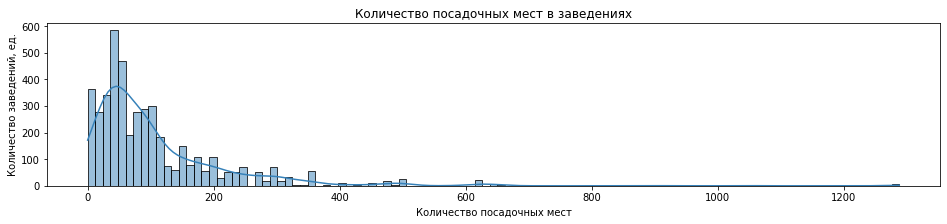

In [15]:
# построим гистограмму для значений seats
plt.figure(figsize=(16, 3))
sns.histplot(data=data, x='seats', kde=True, color='#3681b9')
plt.title('Количество посадочных мест в заведениях')
plt.xlabel('Количество посадочных мест')
plt.ylabel('Количество заведений, ед.')
plt.show()

Количество посадочных мест в большинстве заведений не превышает ~300. Однако, есть заведения, где посадочных мест может быть значительно больше. Построим boxplot, чтобы оценить границы представленных в датасете значений.

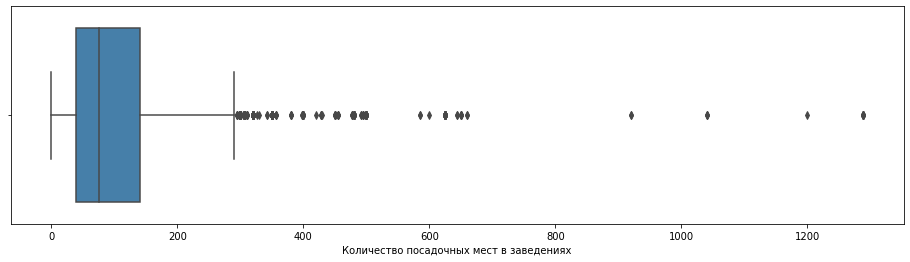

In [16]:
plt.figure(figsize=(16, 4))
sns.boxplot(
    data=data,
    x='seats',
    color='#3681b9'
)
plt.xlabel('Количество посадочных мест в заведениях')
plt.show()

Таким образом, количество посадочных мест в половине заведений находится в диапазоне от ~50 до ~150.

В некоторых заведениях может быть более 300 посадочных мест. И даже больше 1000. Эти величины сами по себе нельзя считать аномальными, так как их значения не выходят за пределы реально существующих. Некоторые банкетные залы могут быть рассчитаны на 500, 800, 1000 гостей.

Выделим заведения с большим количеством посадочных мест и изучим их.

In [17]:
# выделим "аномальные" заведения и для удобства анализа оставим только некоторые столбцы
abnormal_shops = data.query('seats > 300')\
[['name', 'category', 'address', 'seats', 'chain']]\
.sort_values(by='seats', ascending=False)
print(f'Количество заведений с посадочными местами > 300: {abnormal_shops.shape[0]}')

Количество заведений с посадочными местами > 300: 234


In [18]:
display(abnormal_shops.head(20))
display(abnormal_shops.tail(20))

,name,category,address,seats,chain
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",1288.0,False
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",1288.0,True
6838,Alternative coffee,кофейня,"Москва, проспект Вернадского, 41, стр. 1",1288.0,False
6808,Яндекс Лавка,ресторан,"Москва, проспект Вернадского, 51, стр. 1",1288.0,True
6807,Loft-cafe академия,кафе,"Москва, проспект Вернадского, 84, стр. 1",1288.0,False
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",1288.0,True
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",1288.0,True
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",1288.0,False
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",1200.0,False
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",1040.0,False


,name,category,address,seats,chain
6236,Cinnabon,кофейня,"Москва, улица Вавилова, 3",320.0,True
6237,Крошка Картошка,быстрое питание,"Москва, улица Вавилова, 3",320.0,True
4051,Mad Season,"бар,паб","Москва, Зубовский бульвар, 15, стр. 1",320.0,False
709,Корнер Гриль,"бар,паб","Москва, Алтуфьевское шоссе, 16",310.0,False
831,Релти,кафе,"Москва, Алтуфьевское шоссе, 16",310.0,False
555,Styling Bull Cafe,столовая,"Москва, улица Василия Петушкова, 3, корп. 3, с...",310.0,False
683,Чайхона №1,ресторан,"Москва, Алтуфьевское шоссе, 16",310.0,True
3812,Rfr Гриль,ресторан,"Москва, Краснопресненская набережная, 12",308.0,False
1834,Meat Street,"бар,паб","Москва, Новослободская улица, 18",307.0,False
2000,Коптильня,ресторан,"Москва, Новослободская улица, 18",307.0,False


Мы видим, что часто одно и то же значение в столбце seats дублируется сразу для нескольких заведений. Например, значение 1288 записано сразу для первых 8 заведений, которых объединяет нахождение на одной улице - проспекте Вернандского.

Также для 8 заведений, находящихся по адресу: Пятницкая улица, 29, указано 306 посадочных мест.

Таким образом, можно предположить, что значения seats в большинстве "аномальных" записей ошибочны и только исказят результаты работы. Учитывая, что таких заведений всего 234, т.е. менее 3% от количества заведений в датасете, удалим соответствующие записи.

In [19]:
# оставляем записи со значениями < 300 и NaN
data = data.query('seats < 300 | seats.isna()')

In [20]:
print('Исходное количество записей в датасете:', data_raw.shape[0])
print('Количество записей, оставшихся после обработки данных:', data.shape[0])
print(
    'Доля удаленных записей, %:',
    round((data_raw.shape[0] - data.shape[0]) / data_raw.shape[0] * 100, 2)
)

Исходное количество записей в датасете: 8406
Количество записей, оставшихся после обработки данных: 7574
Доля удаленных записей, %: 9.9


Удаленные записи не превышают рекомендованную норму 10%. Таким образом, данные обработаны и готовы для анализа.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Посчитаем сколько данных осталось после отработки выбросов?) 
    Наопминаю, что должны себя держать в пределах 10%. Зполнение медианой плохая идея, это приведет к выбросам. Лучше оставить, как есть, можно попробовать поставить заглушку, но также учитывать ее в исследование 

<div class="alert alert-info">
Сделал
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Хорошо, в 10% уложились 

## Анализ данных

### Распределение заведений по категориям

                 count
category              
кафе              1950
ресторан          1878
кофейня           1345
бар,паб            704
пиццерия           607
быстрое питание    550
столовая           297
булочная           243


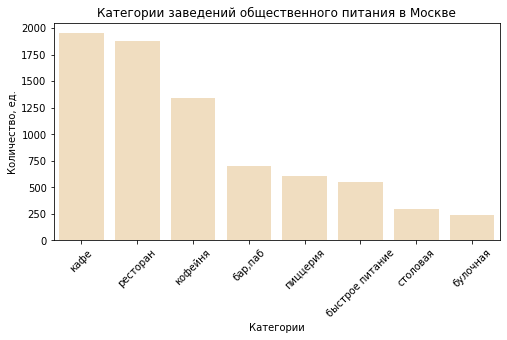

In [21]:
shop_categories = data.groupby('category')\
.agg({'category': 'count'})\
.rename(columns={'category': 'count'})\
.sort_values(by='count', ascending=False)
print(shop_categories)

plt.figure(figsize=(8, 4))
sns.barplot(data=shop_categories, x=shop_categories.index, y='count', color='#f8deb8')
plt.title('Категории заведений общественного питания в Москве')
plt.xlabel('')
plt.xlabel('Категории')
plt.ylabel('Количество, ед.')
plt.xticks(rotation=45)
plt.show()

Категории заведений отличаются по численности. Большинство составляют кафе и рестораны. Третье место по численности занимают кофейни.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Согласен, только подпишем ось Х?

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Отлично .
    

### Распределение посадочных мест в заведениях различных категорий

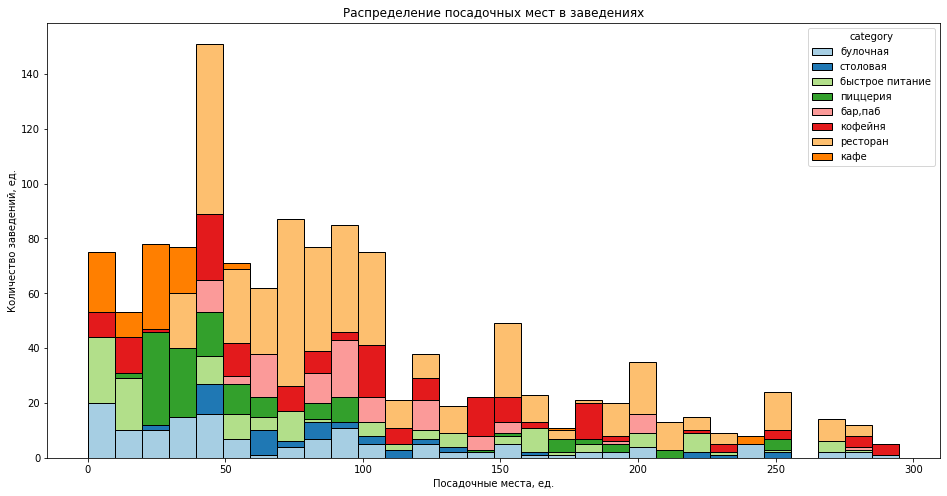

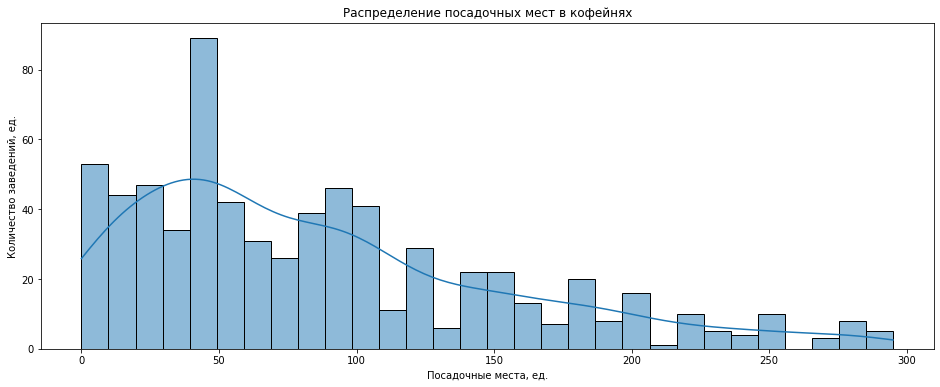

In [22]:
plt.figure(figsize=(16, 8))
sns.histplot(
    data,
    x='seats',
    bins=30,
    hue='category',
    alpha=1,
    # устанавливаем порядок отображения заведений - вначале малочисленные
    hue_order=data['category'].value_counts().sort_values().index.to_list(),
    palette='Paired'
)
plt.title('Распределение посадочных мест в заведениях')
plt.xlabel('Посадочные места, ед.')
plt.ylabel('Количество заведений, ед.')
plt.show()

plt.figure(figsize=(16, 6))
sns.histplot(data.query('category == "кофейня"'), x='seats', bins=30, kde=True)
plt.title('Распределение посадочных мест в кофейнях')
plt.xlabel('Посадочные места, ед.')
plt.ylabel('Количество заведений, ед.')
plt.show()

Построенные гистограммы показывают, что в целом количество посадочных мест в большинстве заведений не превышает 100-110. При этом график позволяет предположить, что рестораны, как правило, тяготеют к большему количеству посадочных мест (50 и более), а кафе, бары, пабы и заведения быстрого питания ориентированы на меньшее количество посетителей (до 50).

Количество посадочных мест в большинстве кофеен не превышает 100, при этом посадочные места в диапозоне 0-100 распределены по отдельным кофейням в примерно равных пропорциях. Исключение составляет хорошо заметный на графике пик в районе 40-50 мест. Больше всего кофеен имеет именно такую вместимость.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Согласен, что в ресторан посадочных мест больше всего, именно там мы собираемя большими компаниями, чтоб отметить др, например) Не забывай подписывать все оси) 

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Топ

### Сетевые и несетевые заведения

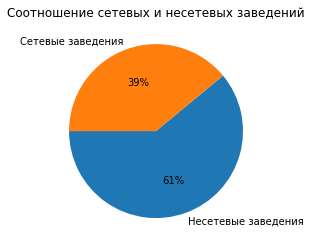

In [23]:
chain_count = data.groupby(
    by='chain'
).agg({
    'chain': 'count'
}).rename(
    index={
        True: 'Сетевые заведения',
        False: 'Несетевые заведения'
    }
)

chain_count.plot(
    kind='pie',
    y='chain',
    autopct='%1.0f%%',
    legend=False,
    startangle=180
)
plt.title('Соотношение сетевых и несетевых заведений')
plt.xlabel('')
plt.ylabel('')
plt.show()

Несетевые заведения составляют большую часть всех заведений Москвы. Однако, доля сетевых заведений также является значительной и составляет 41%.

Определим, какие категории заведений чаще являются сетевыми.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Тут хорошо, несетевых у нас больше

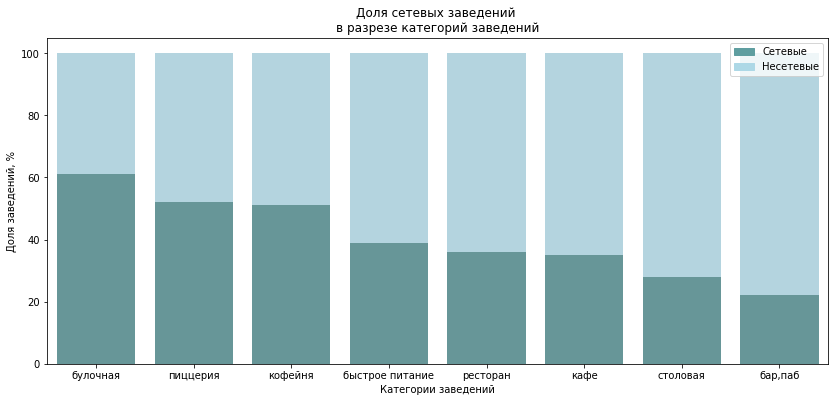

In [24]:
# считаем количество заведений в каждой категории
shops_total = data.groupby('category')\
.agg({'name': 'count'})\
.rename(columns={'name': 'shops_amount'})\
.reset_index()

# считаем количество сетевых заведений в каждой категории
chain_shops_amount = data.query('chain == True')\
.groupby('category')\
.agg({'name': 'count'})\
.rename(columns={'name': 'chain_shops_amount'})\
.reset_index()

shops_by_chain = pd.merge(shops_total, chain_shops_amount, on='category')

# считаем долю сетевых заведений в каждой категории
shops_by_chain['chain_pct'] = shops_by_chain.apply(
    lambda row: round(row['chain_shops_amount'] / row['shops_amount'] * 100),
    axis=1
)
shops_by_chain.sort_values(by='chain_pct', ascending=False, inplace=True)

# строим график, отражающий 100 % всех заведений
plt.figure(figsize=(14, 6))
sns.barplot(
    data=shops_by_chain,
    x='category',
    # по оси ординат - 100 %
    y=[100] * 8,
    color='lightblue'
)

# строим график, отражающий долю сетевых заведений в процентах
sns.barplot(
    data=shops_by_chain,
    x='category',
    y='chain_pct',
    color='cadetblue'
)

plt.title('Доля сетевых заведений \nв разрезе категорий заведений')
plt.xlabel('Категории заведений')
plt.ylabel('Доля заведений, %')
plt.legend(
    title='',
    handles=[
        mpatches.Patch(color='cadetblue', label='Сетевые'),
        mpatches.Patch(color='lightblue', label='Несетевые'),
    ]
)
plt.show()

График показывает, что среди булочных доля сетевых заведений составляет 60%. Доли сетевых и несетевых пиццерий и кофеен примерно равны. Среди баров, заведений быстрого питания, кафе, ресторанов и столовых чаще встречаются несетевые заведения.

Доля сетевых заведений среди баров(пабов) наименьшая - всего ~20%

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> С выводом согласен, но над визуализацией необходимо поработать) Давай по каждой категории рассчитаем процентное соотношение сетевых заведений и затем визуализируем?

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>ТАк-то лучше) Иделаьно!

### Анализ популярности сетей

Построим список 15 самых популярных, т.е. распространенных сетей

In [25]:
top_chains = data.query('chain')\
.groupby('name')\
.agg({'address': 'count', 'category': 'first'})\
.rename(columns={'address': 'shops_amount'})\
.sort_values(by='shops_amount', ascending=False)\
.head(15)
top_chains

,shops_amount,category
name,,
Шоколадница,113,кофейня
Домино'с Пицца,76,пиццерия
Додо Пицца,71,пиццерия
Яндекс Лавка,66,ресторан
One Price Coffee,66,кофейня
Cofix,62,кофейня
Prime,47,ресторан
КОФЕПОРТ,40,кофейня
Хинкальная,39,кафе


Среди 15 самых популярных сетей:
- 5 сетевых кофеен
- 4 сетевых кафе
- 3 сетевых ресторана
- 2 сетевые пиццерии
- 1 сетевая булочная

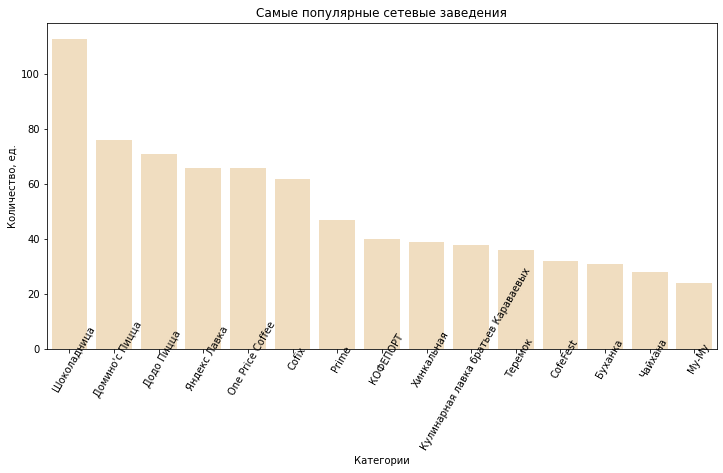

In [26]:
plt.figure(figsize=(12, 6))
sns.barplot(data=top_chains, x=top_chains.index, y='shops_amount', color='#f8deb8')
plt.title('Самые популярные сетевые заведения')
plt.xlabel('Категории')
plt.ylabel('Количество, ед.')
plt.xticks(rotation=60, wrap=True)
plt.show()

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b>  Ага, Шоколадниц в Москве много) Только ось Х не подписана((((((((

<div class="alert alert-info">
Подписал
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Супер!

### Распределение заведений по административным районам Москвы

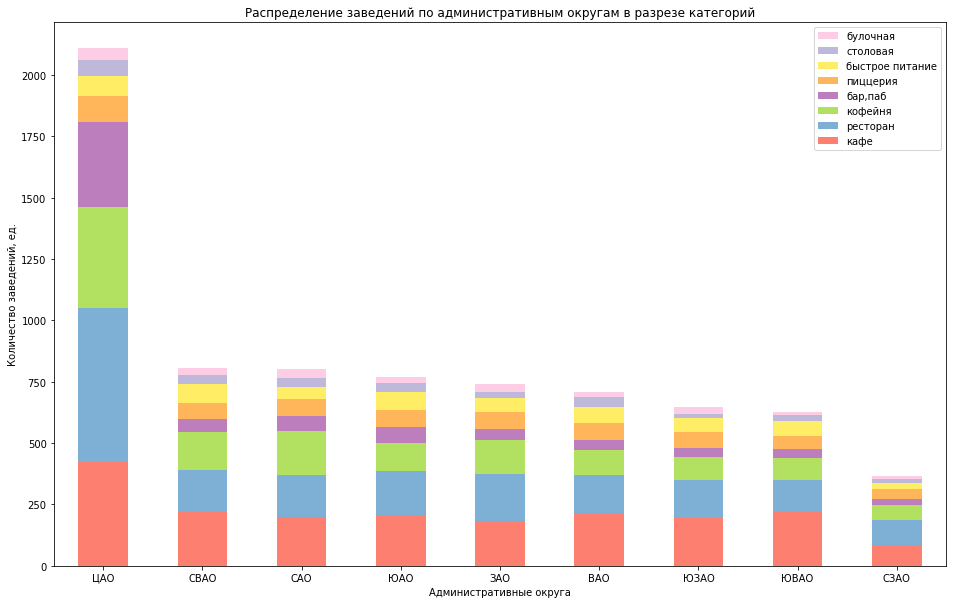

In [27]:
# для каждого округа считаем количество заведений по категориям
shops_by_district = pd.pivot_table(
    data,
    index='district_abbr',
    columns='category',
    values='name',
    aggfunc='count'
)

# сортируем категории в порядке уменьшения количества заведений
shops_by_district = shops_by_district[
    data['category'].value_counts().sort_values(ascending=False).index
]
# сортируем округа в порядке уменьшения количества заведений
shops_by_district = shops_by_district.reindex(
    data['district_abbr'].value_counts().sort_values(ascending=False).index
)

shops_by_district.plot(
    kind='bar',
    stacked=True,
    figsize=(16, 10),
    color=["#fd7f6f", "#7eb0d5", "#b2e061", "#bd7ebe", "#ffb55a", "#ffee65", "#beb9db", "#fdcce5", "#8bd3c7"]

)
plt.title('Распределение заведений по административным округам в разрезе категорий')
plt.xlabel('Административные округа')
plt.xticks(rotation='horizontal')
plt.ylabel('Количество заведений, ед.')
# меняем порядок в легенде
handles, labels = plt.gca().get_legend_handles_labels()
order = [*range(7, -1, -1)]
plt.legend([handles[idx] for idx in order], [labels[idx] for idx in order])
plt.show()

В датасете представлены данные о заведениях в 9 административных округах Москвы. При этом видно, что Центральный административный округ значительно выделяется как по общему количеству заведений, так и по количеству кафе, ресторанов, кофеен и баров(пабов). По количеству пиццерий, столовых, булочных и заведений быстрого питания ЦАО не отличается от других округов.

Отметим, что другие административные округа принципиально не отличаются друг от друга ни по количеству заведений, ни по распределению их категорий. Исключением является Северо-Западный административный округ, у которого количество заведений в 2 раза ниже, чем в остальных округах. Необходимо проверить, не вызвано ли это тем, что данные относительно СЗАО имеются у нас не в полном объеме.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Верно, в центре много туристов и элитных районов) Давай отсортируем график?)

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Отлично!

### Распределение средних рейтингов по категориям заведений

                 mean_rating
category                    
бар,паб             4.395739
пиццерия            4.301977
ресторан            4.296006
кофейня             4.276431
булочная            4.273251
столовая            4.220202
кафе                4.151128
быстрое питание     4.053455


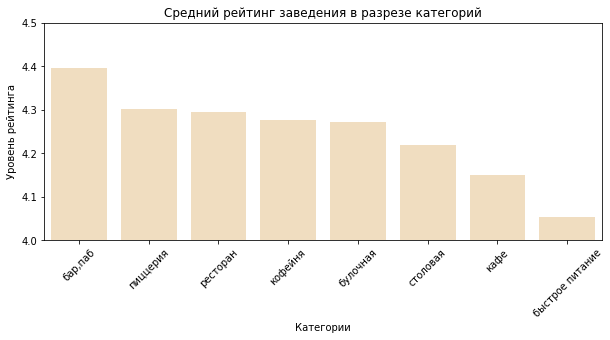

In [28]:
ratings_by_category = data.groupby('category')\
.agg({'rating': 'mean'})\
.rename(columns={'rating': 'mean_rating'})\
.sort_values(by='mean_rating', ascending=False)

print(ratings_by_category)

plt.figure(figsize=(10, 4))
sns.barplot(
    data=ratings_by_category,
    x=ratings_by_category.index,
    y='mean_rating',
    order=ratings_by_category.index,
    color='#f8deb8'
)
plt.title('Средний рейтинг заведения в разрезе категорий')
plt.xlabel('Категории')
plt.ylabel('Уровень рейтинга')
plt.ylim(4, 4.5)
plt.xticks(rotation=45)
plt.show()

График показывает, что средний рейтинг заведения для разных категорий различается и варьируется в пределах от 4.05 до 4.396. Самые высокие рейтинги и, возможно, лояльные посетители - у баров (пабов).

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Хорошечно!

### Средний рейтинг заведений в разрезе административных округов

Отметим на карте Москвы средний рейтинг заведений для каждого из указанных в датасете 9 административных округов.

In [29]:
data.groupby('district', as_index=False)\
.agg({'rating': 'mean'})\
.sort_values(by='rating', ascending=False)

,district,rating
5,Центральный административный округ,4.380702
2,Северный административный округ,4.255486
4,Северо-Западный административный округ,4.238251
1,Западный административный округ,4.195270
7,Юго-Западный административный округ,4.191163
0,Восточный административный округ,4.188434
8,Южный административный округ,4.182727
3,Северо-Восточный административный округ,4.162330
6,Юго-Восточный административный округ,4.123642


In [30]:
msc_map = Map(location=[55.751244, 37.618423], zoom_start=10)

Choropleth(
    geo_data='/datasets/admin_level_geomap.geojson',
    data=data.groupby('district', as_index=False).agg({'rating': 'mean'}),
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.5,
    legend_name='Средний рейтинг заведений по районам',
).add_to(msc_map)

msc_map

Центральный административный округ явно лидирует по среднему рейтингу заведений. На втором месте - Северный АО, а последние места занимают СВАО и ЮВАО.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Иделаьно!

Отметим на карте Москвы все имеющиеся в датасете заведения.

In [31]:
marker_cluster = MarkerCluster().add_to(msc_map)

def show_shop(shop):
    Marker(
        [shop['lat'], shop['lng']],
        popup=f"{shop['category']} {shop['name']} {shop['rating']}",
    ).add_to(marker_cluster)

data.apply(show_shop, axis=1)
msc_map

На карте видим ту же картину, что и ранее на графике распределения заведений - чем ближе к центру города, тем выше плотность размещения заведений.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Дополним выводом? 

<div class="alert alert-info">
Есть
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Поддерживаю!

### 15 улиц Москвы с самым большим количеством заведений

In [32]:
# выбираем топ-15 улиц с самым большим количеством заведений
top_15_streets = data.groupby('street')\
.agg({'name': 'count'})\
.rename(columns={'name': 'shops_amount'})\
.sort_values(by='shops_amount', ascending=False)\
.head(15)
print('Топ-15 улиц с самым большим количеством заведений:\n', top_15_streets)

Топ-15 улиц с самым большим количеством заведений:
                         shops_amount
street                              
проспект Мира                    174
Профсоюзная улица                115
Ленинский проспект                94
проспект Вернадского              93
Дмитровское шоссе                 71
Ленинградское шоссе               67
Ленинградский проспект            67
Варшавское шоссе                  63
Каширское шоссе                   62
Люблинская улица                  56
Кутузовский проспект              52
МКАД                              50
улица Миклухо-Маклая              44
Алтуфьевское шоссе                41
улица Покровка                    40


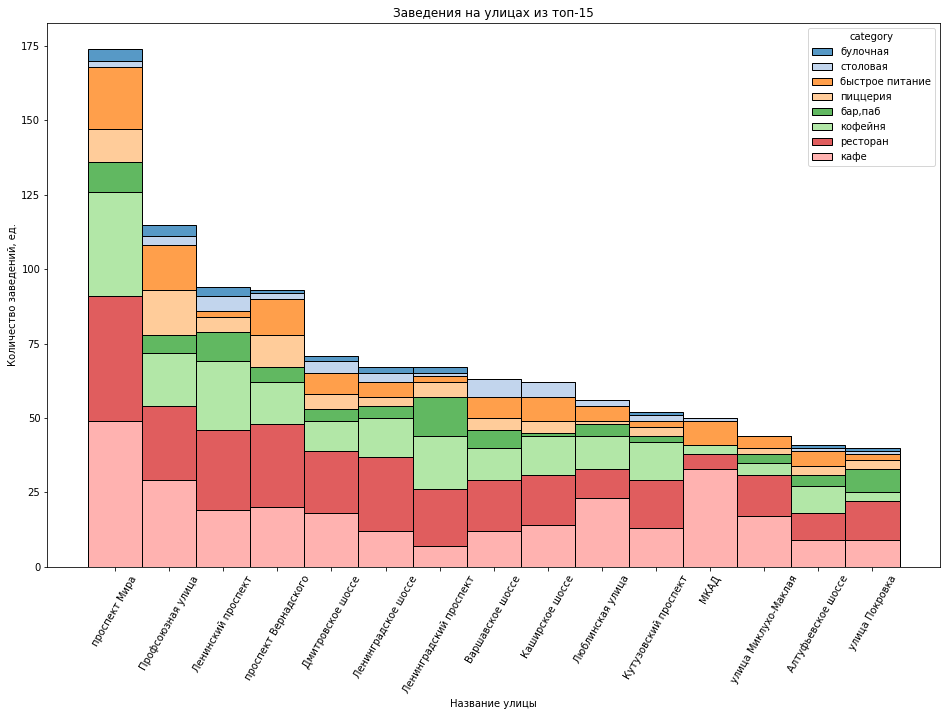

In [33]:
# выбираем заведения, расположенные на улицах из топ-15
shops_by_top_streets = pd.DataFrame()
# перебираем список топ-15 улиц...
for street in top_15_streets.index:
    # собираем датасет, составленный из срезов данных о каждой отдельной улице из топ-15
    shops_by_top_streets= pd.concat([shops_by_top_streets, data.query('street == @street')], axis=0)
    # и получаем отфильтрованный датасет, в котором улицы находятся в порядке, отсортированном по
    # количеству заведений
    # это позволит разместить колонки гистограммы по убыванию
    # более нормального способа я не нашел :)

plt.figure(figsize=(16, 10))
sns.histplot(
    data=shops_by_top_streets,
    x='street',
    hue='category',
    hue_order=data['category'].value_counts().sort_values().index,
    multiple='stack',
    palette='tab20'
)
plt.title('Заведения на улицах из топ-15')
plt.xlabel('Название улицы')
plt.ylabel('Количество заведений, ед.')
plt.xticks(rotation=60)
plt.show()

Лидером и по количеству заведений в целом, и по количеству кафе, ресторанов, кофеен и заведений быстрого питания является проспект Мира.

Отметим существенную разницу в количестве представленных заведений - между пр. Мира и Профсоюзной улицей (1 и 2 место) разница почти в 1.5 раза, а между пр. Мира и Ленинским пр. (1 и 3 место) - разница в 2 раза. Стоит проверить полноту данных в исходном датасете.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Тут согласен, хорошо) 

### Анализ улиц, на которых указано только одно заведение

In [34]:
# считаем, сколько раз в датасете встречается каждая улица
# выбираем улицы, встречающеся только один раз
one_shop_streets = data['street']\
.value_counts()\
.loc[lambda streets_amount: streets_amount == 1] 
one_shop_streets

улица Советской Армии                  1
Братеевский парк                       1
2-й Боткинский проезд                  1
Курсовой переулок                      1
Делегатская улица                      1
                                      ..
Мясницкий проезд                       1
Дербеневская улица                     1
Малый Златоустинский переулок          1
Измайловский парк культуры и отдыха    1
парк Тюфелева роща                     1
Name: street, Length: 477, dtype: int64

В датасете содержится 476 улиц, для которых указано только по одному заведению.

Посмотрим, как эти заведения распределены на карте.

In [35]:
# выбираем срез данных
one_shop_slice = data.query('street in @one_shop_streets.index')

# создаем новую карту
one_shop_map = Map(location=[55.751244, 37.618423], zoom_start=10)
one_shop_cluster = MarkerCluster().add_to(one_shop_map)

def show_one_shop(shop):
    Marker(
        [shop['lat'], shop['lng']],
        popup=f"{shop['category']} {shop['name']} {shop['rating']}",
    ).add_to(one_shop_cluster)

one_shop_slice.apply(show_one_shop, axis=1)
one_shop_map

category
кафе               151
ресторан            99
кофейня             94
бар,паб             41
столовая            39
быстрое питание     28
пиццерия            15
булочная            10
dtype: int64 



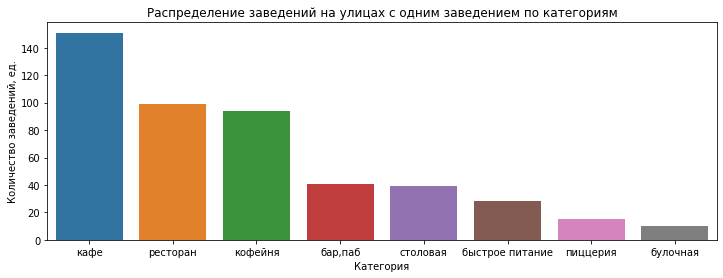

In [36]:
print(one_shop_slice.value_counts('category'), '\n')

plt.figure(figsize=(12, 4))
sns.barplot(
    x=one_shop_slice.value_counts('category').index,
    y=one_shop_slice.value_counts('category')
)
plt.title('Распределение заведений на улицах с одним заведением по категориям')
plt.xlabel('Категория')
plt.ylabel('Количество заведений, ед.')
plt.show()

Помимо того, что заведения, являющиеся единственными на своей улице, распределены равномерно по всему городу, они распределены по категориям примерно так же, как распределены все заведения в Москве.

Можно предположить, что такая картины вызвана неполнотой исходного датасета. Прежде чем продолжать исследование улиц только с одним заведением, стоит проверить полученные данные.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Верно

### Анализ медианных чеков в разных районах

In [37]:
median_bill_by_district = data.groupby('district', as_index=False)\
.agg({'middle_avg_bill': 'median'})\
.rename(columns={'middle_avg_bill': 'median_bill'})\
.sort_values(by='median_bill', ascending=False)

median_bill_by_district

,district,median_bill
5,Центральный административный округ,1000.0
1,Западный административный округ,925.0
4,Северо-Западный административный округ,687.5
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,444.5


Самый высокий медианный счет - в Центральном административном округе. При этом он значительно превышает медианные счета в других округах.

In [38]:
# создаем новую карту
median_bill_map = Map(location=[55.751244, 37.618423], zoom_start=10)

Choropleth(
    geo_data='/datasets/admin_level_geomap.geojson',
    data=median_bill_by_district,
    columns=['district', 'median_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Медианный чек по административным округам',
).add_to(median_bill_map)

median_bill_map

По уровню медианного чека лидирует Центральный административный округ. Отметим, что ЦАО также лидирует по среднему рейтингу заведений, а также по доле ресторанов, баров и кофеен. Можно предположить, что именно в ЦАО сосредоточены самые 'дорогие' заведения, что и обусловливает уровень медианного чека.

На втором месте - Западный АО, существенно опережающий другие округа.

Самый низкий медианный чек - в СВАО, ЮВАО и ЮАО.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Согласен, ЦАО как всегда в топе)

### Вывод

На рынке общественного питания в Москве представлены различные категорий заведений, доли которых различаются. Наиболее многочисленны кафе и рестораны. Кофейни также образуют значительную долю - почти 18 % от общего количества всех заведений.

41 % заведений в Москве являются сетевыми. Кафе, рестораны и бары преимущественно являются несетевыми, в то время как среди кофеен и пиццерий доли сетевых и несетевых заведений примерно равны.

Мы составили список 15 самых популярных сетей, в которые вошли 5 сетевых кофеен, 4 сетевых кафе, 3 сетевых ресторана, 2 сетевые пиццерии и 1 сетевая булочная. Самой популярной сетью в Москве, согласно полученным данным, стала кофейня 'Шоколадница' (113 заведений).

Средний рейтинг заведений отличается в зависимости от их категории. Так, бары (пабы) отличаются наиболее высоким средним рейтингом (почти 4.4 балла), а наиболее низкий средний рейтинг - у заведения фастфуда (4.05 балла).

Центральный административный округ лидирует среди других округов Москвы и в части количества заведений, и в части уровня этих заведений (в ЦАО самый высокий средний рейтинг и средний чек).

Таким образом, принимать решение об открытии заведения следует, изучив особенности размещения заведений этой категории в соответствующем районе (округе).

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Вывод отражает проделанную работу!

## Анализ условий работы кофеен в Москве

In [39]:
coffee_shops_data = data.query('category == "кофейня"').copy()
print('Всего кофеен в датасете:', coffee_shops_data.shape[0], '\n')
print('Кофеен с уникальным фирменным наименованием:', coffee_shops_data['name'].nunique(), '\n')
print('Количество сетей:', coffee_shops_data.query('chain')['name'].nunique(), '\n')
print('Количество сетевых кофеен:', coffee_shops_data.query('chain').shape[0], '\n')
print(
    '10 сетей с наибольшим количеством заведений в Москве:\n',
    coffee_shops_data.query('chain')['name'].value_counts().head(10)
)

Всего кофеен в датасете: 1345 

Кофеен с уникальным фирменным наименованием: 809 

Количество сетей: 157 

Количество сетевых кофеен: 681 

10 сетей с наибольшим количеством заведений в Москве:
 Шоколадница         112
One Price Coffee     66
Cofix                62
КОФЕПОРТ             40
CofeFest             31
Кофемания            20
Cinnabon             18
Правда кофе          10
Krispy Kreme          8
Coffeekaldi's         8
Name: name, dtype: int64


In [40]:
coffee_shops_map = Map(location=[55.751244, 37.618423], zoom_start=10)
GeoJson('/datasets/admin_level_geomap.geojson').add_to(coffee_shops_map)
coffee_shops_cluster = MarkerCluster().add_to(coffee_shops_map)

def show_coffee_shop(shop):
    Marker(
        [shop['lat'], shop['lng']],
        popup=f"{shop['category']} {shop['name']} {shop['rating']}",
    ).add_to(coffee_shops_cluster)
    
coffee_shops_data.apply(show_coffee_shop, axis=1)
coffee_shops_map

На карте видно, что кофейни в Москве распределены неравномерно, плотность их размещений в центре значительно выше, чем в других частях города.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Ну что и ожидаемо) 

                                         coffee_shops_amount district_abbr
district                                                                  
Центральный административный округ                       410           ЦАО
Северный административный округ                          182           САО
Северо-Восточный административный округ                  154          СВАО
Западный административный округ                          139           ЗАО
Южный административный округ                             116           ЮАО
Восточный административный округ                         101           ВАО
Юго-Западный административный округ                       93          ЮЗАО
Юго-Восточный административный округ                      88          ЮВАО
Северо-Западный административный округ                    62          СЗАО


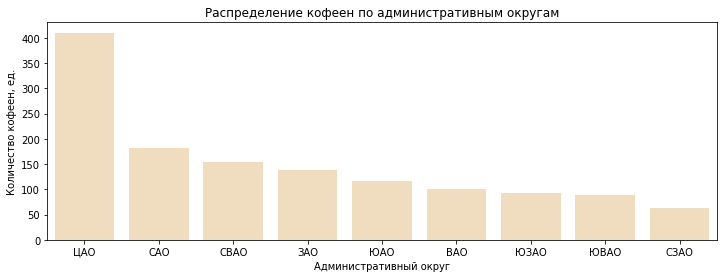

In [41]:
coffee_shops_by_district = coffee_shops_data.groupby('district')\
.agg({'name': 'count', 'district_abbr': 'first'})\
.rename(columns={'name': 'coffee_shops_amount'})\
.sort_values(by='coffee_shops_amount', ascending=False)
print(coffee_shops_by_district)

plt.figure(figsize=(12, 4))
sns.barplot(
    x=coffee_shops_by_district['district_abbr'],
    y=coffee_shops_by_district['coffee_shops_amount'],
    color='#f8deb8'
)
plt.title('Распределение кофеен по административным округам')
plt.xlabel('Административный округ')
plt.ylabel('Количество кофеен, ед.')
plt.show()

Центральный административный округ значительно опережает другие округа по количеству кофеен.

Посмотрим, как распределяются по округам сетевые и несетевые кофейни.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Хорошо) 

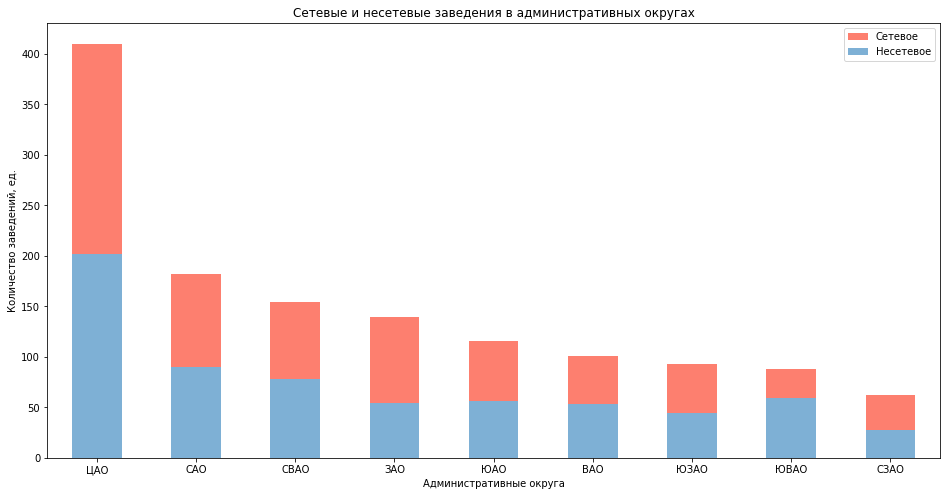

In [42]:
# считаем количество сетевых и несетевых кофеен в каждом округе
coffee_shops_by_chain_status = coffee_shops_data\
.groupby(['district_abbr', 'chain'])\
.agg({'name': 'count'})\
.rename(columns={'name': 'coffee_shops_amount'})\
.reset_index()

coffee_shops_by_chain_status['chain'] = coffee_shops_by_chain_status['chain'].map(
    lambda is_chain: 'Сетевое' if is_chain else 'Несетевое'
)

# трансформируем датасет для удобной визуализации
coffee_shops_by_chain_status = pd.pivot_table(
    coffee_shops_by_chain_status,
    index='district_abbr',
    columns='chain',
    values='coffee_shops_amount',
    aggfunc='first'
)

# сортируем округа по количеству кофеен в них
districts_order = coffee_shops_data['district_abbr']\
.value_counts().sort_values(ascending=False).index
coffee_shops_by_chain_status = coffee_shops_by_chain_status.reindex(districts_order)

coffee_shops_by_chain_status.plot(
    figsize=(16, 8),
    kind='bar',
    stacked=True,
    color=["#7eb0d5", "#fd7f6f"]
)
plt.title('Сетевые и несетевые заведения в административных округах')
plt.xlabel('Административные округа')
plt.xticks(rotation='horizontal')
plt.ylabel('Количество заведений, ед.')
# меняем порядок в легенде
handles, labels = plt.gca().get_legend_handles_labels()
order = [*range(1, -1, -1)]
plt.legend([handles[idx] for idx in order], [labels[idx] for idx in order])
plt.show()

В целом, соотношение сетевых и несетевых кофеен в административных округах равное, за исключением ЗАО, где преобладают сетевые кофейни, и ЮВАО, где преобладают несетевые.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b>  Отсортируем?)

<div class="alert alert-info">
Сделал
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> +++

In [43]:
day_and_night_shops = coffee_shops_data.loc[coffee_shops_data['is_24/7']]
print('Количество круглосуточных кофеен:', day_and_night_shops.shape[0])
print('Количество сетевых кофеен среди круглосуточных:', day_and_night_shops['chain'].sum())

Количество круглосуточных кофеен: 58
Количество сетевых кофеен среди круглосуточных: 49


В Москве есть кругосуточные кофейни, однако их количество составляет всего 4% от общего количества кофеен. При этом большинство из них являются сетевыми.

Сравним рейтинги кофеен из разных административных округов.

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>  Ага, верно

In [44]:
coffee_shops_rating = coffee_shops_data\
.groupby(['district_abbr', 'chain'], as_index=False)\
.agg(
    mean_rating=('rating', 'mean'),
    median_rating=('rating', 'median')
)
coffee_shops_rating['chain'] = coffee_shops_rating['chain'].map(
    lambda is_chain: 'Сетевое' if is_chain else 'Несетевое'
)

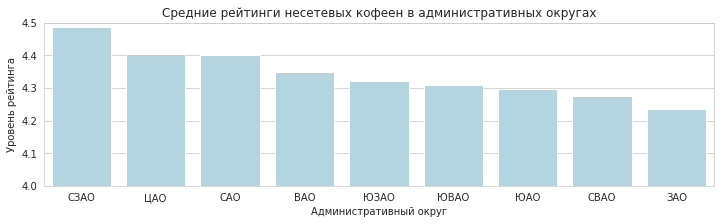

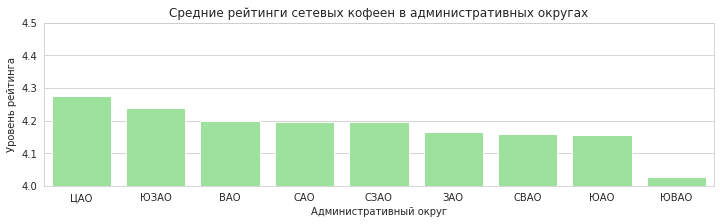

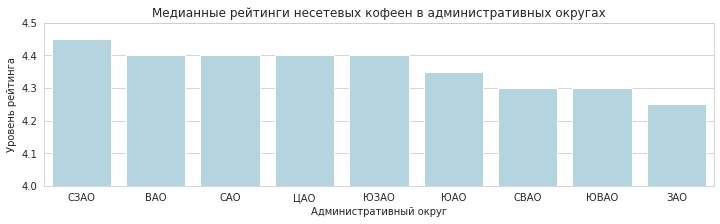

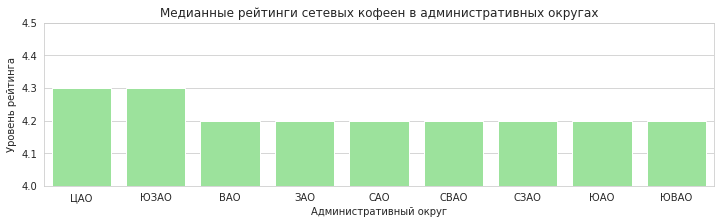

In [45]:
# используем сетку для наглядности
sns.set_style('whitegrid')

plt.figure(figsize=(12, 3))
sns.barplot(
    data=coffee_shops_rating.query('chain == "Несетевое"').sort_values(by='mean_rating', ascending=False),
    x='district_abbr',
    y='mean_rating',
    color='lightblue'
)
plt.title('Средние рейтинги несетевых кофеен в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Уровень рейтинга')
plt.ylim(4, 4.5)
plt.show()

plt.figure(figsize=(12, 3))
sns.barplot(
    data=coffee_shops_rating.query('chain == "Сетевое"').sort_values(by='mean_rating', ascending=False),
    x='district_abbr',
    y='mean_rating',
    color='lightgreen'
)
plt.title('Средние рейтинги сетевых кофеен в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Уровень рейтинга')
plt.ylim(4, 4.5)
plt.show()

plt.figure(figsize=(12, 3))
sns.barplot(
    data=coffee_shops_rating.query('chain == "Несетевое"').sort_values(by='median_rating', ascending=False),
    x='district_abbr',
    y='median_rating',
    color='lightblue'
)
plt.title('Медианные рейтинги несетевых кофеен в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Уровень рейтинга')
plt.ylim(4, 4.5)
plt.show()

plt.figure(figsize=(12, 3))
sns.barplot(
    data=coffee_shops_rating.query('chain == "Сетевое"').sort_values(by='median_rating', ascending=False),
    x='district_abbr',
    y='median_rating',
    color='lightgreen'
)
plt.title('Медианные рейтинги сетевых кофеен в административных округах')
plt.xlabel('Административный округ')
plt.ylabel('Уровень рейтинга')
plt.ylim(4, 4.5)
plt.show()

# вернемся к дефолтным настройкам
sns.reset_defaults()

В каждом округе средний и медианный рейтинги несетевых кофеен значительно выше, чем рейтинги сетевых.

Медианные рейтинги сетевых кофеен почти во всех округах одинаковы - 4.2 (за исключением ЦАО и ЮЗАО, где медианный рейтинг сетевой кофейни выше - 4.3). А вот у несетевых кофеен диапазон значений медианного рейтинга шире (от 4.25 до 4.45), а сами значения отличются в зависимости от округа. Самый высокий медианный рейтинг у несетевых кофеен СЗАО - ~4.45, а самый низкий в ЗАО - ~4.25. Отметим, что самый низкий медианный рейтинг несетевых кофеен всё равно выше медианного рейтинга сетевых кофеен в большинстве округов.

Кроме того, в Северо-Западном округе мы видим наиболее значительный разрыв в рейтингах несетевых и сетевых кофеен.

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b> Давай отстортируем графики?) 

<div class="alert alert-info">
Отсортировал столбцы и изменил визуализацию. Теперь столбцы для сетевых и несетевых кофеен я располагаю не вместе, через hue='chain', а на разных графиках. Это немного неудобно, но для целей нашего исследования, кажется, нормально? )
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b> Да, так гораздно нагляднее, лайк!

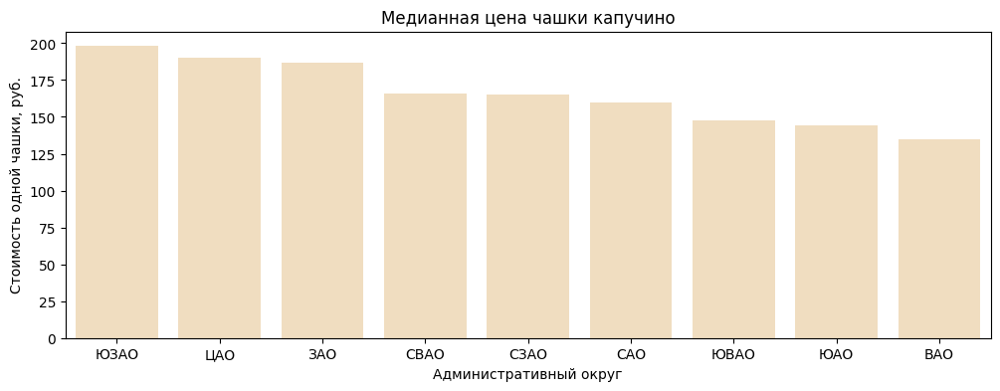

In [46]:
median_coffee_bill = coffee_shops_data.groupby('district_abbr')\
.agg({
    'middle_coffee_cup': 'median',
    'district': 'first'

})\
.sort_values(by='middle_coffee_cup', ascending=False)

plt.figure(figsize=(12, 4))
sns.barplot(
    x=median_coffee_bill.index,
    y=median_coffee_bill['middle_coffee_cup'],
    color='#f8deb8'
)
plt.title('Медианная цена чашки капучино')
plt.xlabel('Административный округ')
plt.ylabel('Стоимость одной чашки, руб.')
plt.show()

Самая высокая медианная стоимость чашки капучино - в ЮЗАО, при том, что этот округ находится на 7 месте по численности кофеен.

Визуализируем найденные отличия в ценах на карте.

In [47]:
median_coffee_bill_map = Map(location=[55.751244, 37.618423], zoom_start=10)

Choropleth(
    geo_data='/datasets/admin_level_geomap.geojson',
    data=median_coffee_bill,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.4,
    legend_name='Медианная цена чашки капучино по административным округам',
).add_to(median_coffee_bill_map)

median_coffee_bill_map

<div class="alert alert-success">
<h2> Комментарий ревьюера v1 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Верно, странно, чт осамая высокая стоимость чашки не в центре

## Вывод

Настоящее исследование проводилось с целью описания закономерностей функицонирования рынка общестенного питания в Москве, которое позволило бы более объективно принять решение об инвестировании в новое заведение - кофейню.

Для изучения была взята сводная база данных, составленная на основе сервисов Яндекс.Карты и Яндекс.Бизнес по состоянию на лето 2022 года и включающая 7 577 заведений. Территория исследования - 9 административных округов Москвы.

Все заведения в представленных данных были разделены на следуюшие категории: кафе, рестораны, кофейни, пиццерии, бары и пабы, фастфуд, булочные, столовые.

Более половины заведений Москвы - это кафе и рестораны, их доли от общего количества заведений составляют по ~25%. Кофейни также достаточно многочисленны (18%). Доля баров (пабов) - 9%. В наименьшей степени представлены булочные - 3%.

Рынок общественного питания был проанализирован в разрезе административных округов. При этом видно, что Центральный административный округ значительно выделяется как по общему количеству заведений, так и по количеству кафе, ресторанов, кофеен и баров(пабов). Однако, по количеству пиццерий, столовых, булочных и заведений быстрого питания ЦАО не отличается от других округов.

Кроме того, именно для заведений Центрального округа характерны более высокий средний чек и более высокий средний рейтинг по сравнению с заведениями других округов.

41% заведений в Москве являются сетевыми. При этом половина кофеен и пиццерий - сетевые. А вот кафе, рестораны и бары преимущественно являются несетевыми. Только для булочных можно видеть явное преобладание сетевых заведений

**Кофейни**

Главной задачей исследования стал анализ особенностей размещения и работы кофеен.

Половина кофеен в Москве - это сетевые кофейни. К самым популярным сетевым кофейням, т.е. кофейням с наибольшим количеством точек, относятся, в частности:
- Шоколадница (112 точек)
- One Price Coffee (66 точек)
- КОФЕПОРТ (40 точек)
- CofeFest (31 точка)
- Кофемания (20 точек)

Вторая половина московских кофеен, соответственно, несетевые.

Центральный административный округ значительно опережает другие округа по количеству кофеен.

Доля круглосуточных кофеен составляет всего 4%. Это, прежде всего, сетевые кофейни.

Большинство кофеен рассчитаны, преимущественно, на 40-50 посадочных мест.

Был составлен рейтинг округов по медианной стоимости чашки капучино. Три самых "дорогих" округа:
- Юго-Западный округ, 198 руб.
- Центральный округ, 190 руб.
- Западный округ, 187 руб.

Для каждого административного округа был построен график, демонстрирующий средние и медианные пользовательские рейтинги кофеен. Эти графики показали, что в Москве рейтинг несетевых кофеен в каждом округе выше аналогичного рейтинга сетевых. Можно предположить, что именно несетевые кофейни, отличающиеся индивидуальными, оригинальными особенностями в большей степени привлекательны для клиентов в Москве.

Самый высокий медианный рейтинг среди несетевых кофеен - у кофеен Северо-Западного округа (4.45), а самый низкий - у кофеен Западного округа (4.25).

Проведенный анализ позволяет предположить, что наиболее сильная конкуренция для новой кофейни ожидается в Центральном и Северо-Западном округах. В ЦАО мы видим большое количество кофеен с высоким рейтингом. СЗАО, хотя и находится по количеству кофеен на последнем месте, тем не менее показывает максимальный медианный рейтинг кофеен.

В качестве итогового вывода выдвинем следующую гипотезу: особо переспективными для открытия новой кофейни могут считаться Северо-Западный и Западный административные округа.

СЗАО отличается одновременно малым количеством кофеен и лояльной аудиторией, которая, судя по пользовательским рейтингам, ценит кофе и кофейни.

ЗАО, напротив, характеризуется одновременно большим количеством кофеен и их сравнительно низким рейтингом, а также высокой средней стоимостью кофе.

Таким образом, качественная и недорогая кофейня, 'крутая и доступная, как "Central Perk"', может привлечь внимание потенциальных клиентов, прежде всего, в Севере-Западном и Западном округах.

[Презентация проекта](https://disk.yandex.ru/i/84fuAHl8dgAu7w)

<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера v1 <a class="tocSkip"></h2>

<b>На доработку🤔:</b>  Исправим замечания и доработаем презентацию? Давай сделаем ее пообъемнее? Добавим побольше выводов и визуадизаций? И не забывай на всех графиках подписывать ось Х (не стал добавлять замечания по всему проекту) и все будет супер) 

<div class="alert alert-info">
Изменил выводы - теперь перспективен не только ЗАО, но еще и СЗАО )
Расширил презентацию и немного изменил ее текст
</div>

<div class="alert alert-success">
<h2> Комментарий ревьюера v2 <a class="tocSkip"> </h2>

<b>Все супер!👍:</b>Презентация отражает проделанную работу!

<div style="border:solid Chocolate 2px; padding: 40px">
    
**Общий вывод по проекту ревьювера**:
Виктор, спасибо за  проект! Ты приложил много усилий, чтобы довести его до конца, проделана огромная работа, и это видно невооруженным глазом, ты большой молодец!
    
**Отмечу положительные моменты**:
    
    1. Все разложено по полочкам, всегда понятен ход твоих мыслей, приятно смотреть
    
    2. Отличные визуализации
    
    3. На разных шагах проекта ты предлагал очень интересные решения и методы для их реализации. Хорошая работа!
    
    
**На что стоит обратить внимание**:
    
    1. Оформление визуализаций
    
    
**Удачи и жду твой проект на повторное ревью!**

<div style="border:solid Chocolate 2px; padding: 40px">
    
**Общий вывод по проекту ревьювера v2**:
Виктор, ошибки исправлены, проект принят, поздравляю тебя! Успешной учебы и еще увидимся в Практикуме!